In [308]:
%load_ext autoreload
%autoreload 2
import sys; sys.path.append('../')
from src.dataLoader import load_data
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns; 
from tqdm import tqdm
from wordcloud import WordCloud, STOPWORDS

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [260]:
network, meta, ratings = load_data()

# Piwa - browary

In [108]:
meta.head(10)

,name,brewery,rating,logo_link,beer_id,blg,alc,ibu,STYL,CHMIELE,SŁODY,DROŻDŻE,KONTRAKTOR,INNE DODATKI
0,Rowing Jack,ALEBROWAR,4.2,https://www.polskikraft.pl/img/photos/14422467...,1,16,6.2,70,American India Pale Ale,"Simcoe (USA), Chinook (USA), Citra (USA), Casc...","Pale Ale, Pszeniczny, Wiedeński, Carapils®",Safale US-05,Gościszewo,NaN
1,70 Szylingów,PINTA,3.5,https://www.polskikraft.pl/img/photos/14429079...,2,-,3.2,-,Scottish Ale 70,East Kent Goldings (GB),"Pale Ale Weyermann®, Carapils®, Wędzony Wayerm...",Safbrew S-33,Pinta,NaN
2,a ja pale ale,PINTA,3.7,https://www.polskikraft.pl/img/photos/14422597...,3,12,4.5,-,American Pale Ale,"Columbus (USA), Chinook (USA), Cascade (USA), ...","Pale Ale Weyermann®, Diastatyczny jęczmieny We...",Safale US-05,Pinta,NaN
3,a'la Grodziskie,PINTA,3.2,https://www.polskikraft.pl/img/photos/14422607...,4,7.8,2.6,-,Grodziskie,Lubelski (PL),Pszeniczny wędzony,Safbrew S-33,Pinta,NaN
4,Ale Szycha,PINTA,4.2,https://www.polskikraft.pl/img/photos/14423453...,5,13.1,5.0,-,Polskie Ale,"Marynka szyszka (PL), Lubelski szyszka (PL)",Pilzneńśki Premium Weyermann,Fermentis S-04,Pinta,NaN
5,Angielskie Śniadanie,PINTA,3.2,https://www.polskikraft.pl/img/photos/14459743...,6,14,5.3,-,Extra Special Bitter,East Kent Goldings (GB),"Muntons Whole Blend Maris Otter, Pale Ale Weye...",Fermentis S-04,Pinta,NaN
6,Apetyt na Życie,PINTA,3.5,https://www.polskikraft.pl/img/photos/14459743...,7,13.1,5.0,18,Roggenbier,"Tettnanger (DE), Spalt Select (DE)","Pilzneński Weyermann®, Żytni Weyermann®, Wiede...",Fermentis WB-06,Pinta,NaN
7,Atak Chmielu,PINTA,3.9,https://www.polskikraft.pl/img/photos/14578238...,8,15.1,6.1,58,American IPA,"Citra (USA), Simcoe (USA), Cascade (USA), Amar...","Pale Ale Weyermann®, Melanoidynowy Weyermann, ...",Safale US-05,Pinta,NaN
8,Call me Simon,PINTA,3.8,https://www.polskikraft.pl/img/photos/14459745...,9,19.1,6.9,78,Imperial Irish Red Ale,"Columbus (USA), Amarillo (USA), Mosaic (USA)","Pale Ale Weyermann®, Wiedeński Weyermann®, Car...",Fermentis S-04,Pinta,NaN
9,Ce n'est pas IPA Blonde,PINTA,3.4,https://www.polskikraft.pl/img/photos/14460621...,10,14,5.7,18,Biere de Garde,"Aramis (FR), StrisselSpalt (FR)","Jasny Klepiskowy Weyermann, Pale Ale Weyermann...",Safale T-58,Pinta,"Cukier, Suszona skórka słodkiej pomarańczy, Mą..."


In [20]:
print(f"Jest {len(meta)} piw, ale tylko {len(np.unique(ratings.beer_id.values))} jest ocenionych.")

Jest 9705 piw, ale tylko 9153 jest ocenionych.


In [24]:
print(f"Jest {len(np.unique(meta.brewery.values))} różnych browarów które posiadają swoje piwa w aplikacji")

Jest 405 różnych browarów które posiadają swoje piwa w aplikacji


In [36]:
fig = px.histogram(meta, x="brewery").update_xaxes(categoryorder="total descending")
fig.show()

In [92]:
df_group=meta.groupby(["brewery"]).size().sort_values(ascending=False)

# 10 najpopularniejszych browarów to

In [93]:
print(f"{list(df_group.head(10).index)}")

['PINTA', 'PRACOWNIA PIWA', 'PIWNE PODZIEMIE', 'ARTEZAN', 'NEPOMUCEN', 'BROKREACJA', 'HOPIUM', 'BROWAR ZAKŁADOWY', 'DOCTOR BREW', 'BROWAR STU MOSTÓW']


In [97]:
print(f"Najpopularniejszy browar {df_group._index[0]} ma aż {df_group[0]} piw w aplikacji. Najmniej piw ma {df_group._index[-1]} z {df_group[-1]} piwem ")

Najpopularniejszy browar PINTA ma aż 246 piw w aplikacji. Najmniej piw ma OMNIPOLLO z 1 piwem 


In [102]:
print(f"Jest tylko {len(df_group[df_group==1])} z 1 piwem")

Jest tylko 29 z 1 piwem


In [103]:
print(f"Jest tylko {len(df_group[df_group==1])} z 1 piwem")

Jest tylko 29 z 1 piwem


23.962962962962962

In [107]:
print(f"Średnia ilość piw na browar to {df_group.mean()}")
print(f"Mediana piw na borwar {df_group.median()}")
print(f"Odchylenie std piw na borwar {df_group.std()}")

Średnia ilość piw na browar to 23.962962962962962
Mediana piw na borwar 10.0
Odchylenie std piw na borwar 33.934504638501885


In [287]:
#meta['DataFrame Column'] = df['DataFrame Column'].replace(np.nan, 0)
meta["ibu"]=pd.to_numeric(meta["ibu"], downcast="float")
meta["blg"]=pd.to_numeric(meta["blg"], downcast="float")
meta["alc"]=pd.to_numeric(meta["alc"], downcast="float")
for column in meta.columns:
    #meta[column]=meta[column].replace('-',np.nan)
    if meta[column].notna().all():
        print("Kolumna :",column," -Posiada wszystkie dane")
    else:
        X=len(meta)-len(meta[meta.SŁODY.notna()==False])
        print("Kolumnie :",column," - Brakuje",X,"danych")

Kolumna : name  -Posiada wszystkie dane
Kolumna : brewery  -Posiada wszystkie dane
Kolumnie : rating  - Brakuje 2056 danych
Kolumna : logo_link  -Posiada wszystkie dane
Kolumna : beer_id  -Posiada wszystkie dane
Kolumnie : blg  - Brakuje 2056 danych
Kolumna : alc  -Posiada wszystkie dane
Kolumnie : ibu  - Brakuje 2056 danych
Kolumnie : STYL  - Brakuje 2056 danych
Kolumnie : CHMIELE  - Brakuje 2056 danych
Kolumnie : SŁODY  - Brakuje 2056 danych
Kolumnie : DROŻDŻE  - Brakuje 2056 danych
Kolumnie : KONTRAKTOR  - Brakuje 2056 danych
Kolumnie : INNE DODATKI  - Brakuje 2056 danych


# Najlepsze piwa według oceny userów

In [158]:
beer_rating = ratings.groupby(["beer_id"]).mean().rating.sort_values(ascending=False)
meta.iloc[list(beer_rating._index[:10])]

,name,brewery,rating,logo_link,beer_id,blg,alc,ibu,STYL,CHMIELE,SŁODY,DROŻDŻE,KONTRAKTOR,INNE DODATKI
7605,Duch Mango,BROWAR DZIKI WSCHÓD,4.0,https://www.polskikraft.pl/img/photos/15524295...,7641,-,4.0,-,Mango Gose,NaN,NaN,NaN,NaN,NaN
8051,Beatnik Rose,KINGPIN,4.0,https://www.polskikraft.pl/img/photos/14436797...,8087,10.5,5.7,-,Rose Brut IPA,NaN,NaN,NaN,NaN,"Sok z żurawiny, Hibiskus"
7869,Saule,BROWAR SZPUNT,NaN,https://www.polskikraft.pl/img/photos/15677050...,7905,12.5,5.1,-,Hefeweizen,NaN,NaN,NaN,NaN,NaN
7928,Porter Bałtycki,BROWAR BAZYLISZEK,NaN,https://www.polskikraft.pl/img/photos/14585615...,7964,-,8.1,-,Baltic Porter,NaN,NaN,NaN,NaN,"Laktoza, Wiśnie"
839,Kocham Cię jak Irlandię,BROWAR BAZYLISZEK,2.0,https://www.polskikraft.pl/img/photos/14586378...,846,12,4.5,50,Zielony Ale,NaN,NaN,NaN,NaN,NaN
6101,Świeże,BROWAR TENCZYNEK,2.5,https://www.polskikraft.pl/img/photos/14683931...,6131,-,5.0,-,Lager,NaN,NaN,NaN,NaN,NaN
8847,Salamander Imperial Witbier,BROWAR STU MOSTÓW,3.3,https://www.polskikraft.pl/img/photos/15801499...,8883,16,6.5,30,Imperial Witbier,NaN,NaN,NaN,NaN,NaN
5913,Na Kaca,BROWAR BK,2.2,https://www.polskikraft.pl/img/photos/15127645...,5942,-,0.5,-,Bezalkoholowa APA,NaN,NaN,NaN,NaN,NaN
3525,Chmielarz - Klasyczny Lager,BROWAR NIECHANOWO,2.3,https://www.polskikraft.pl/img/photos/14983327...,3548,11.5,5.0,30,Lager,"Marynka (PL), Lubelski (PL)",Pilzneński,NaN,NaN,NaN
8140,Karasol,BROWAR KARUZELA,NaN,https://www.polskikraft.pl/img/photos/14650612...,8176,-,6.5,-,Vermont IPA,NaN,NaN,NaN,NaN,NaN


# Najlepsze piwa według metadanych

In [157]:
meta.sort_values(['rating'],ascending=False).head(10)

,name,brewery,rating,logo_link,beer_id,blg,alc,ibu,STYL,CHMIELE,SŁODY,DROŻDŻE,KONTRAKTOR,INNE DODATKI
3419,P.I.S & Love Jack Daniels BA,BIRBANT,5.0,https://www.polskikraft.pl/img/photos/14433749...,3442,24.5,10.5,70,Russian Imperial Stout,NaN,NaN,NaN,NaN,NaN
8015,APA,ABYSS BREWERY,5.0,https://www.polskikraft.pl/img/photos/15819735...,8051,-,5.0,-,American Pale Ale,"Citra (USA), Galaxy (AUS), Simcoe (USA)",NaN,NaN,NaN,NaN
5235,Lilith Ice,BROWAR GOLEM,5.0,https://www.polskikraft.pl/img/photos/14487002...,5264,-,15.0,-,Ice RIS,NaN,NaN,NaN,NaN,NaN
6881,Iced Ristafa BBA,BROWAR KAZIMIERZ,5.0,https://www.polskikraft.pl/img/photos/14956151...,6915,-,14.0,-,Imperial Stout,NaN,NaN,NaN,NaN,NaN
6071,Belgian Dark Strong Ale Rum B.A.,UŁAN BROWAR,5.0,https://www.polskikraft.pl/img/photos/15398820...,6101,24,10.0,-,Belgian Dark Strong Ale,NaN,NaN,NaN,NaN,NaN
595,Kevin Spices,HOPIUM,5.0,https://www.polskikraft.pl/img/photos/14546796...,602,13.2,5.5,17,Pale Ale,NaN,NaN,NaN,NaN,"Imbir, Skórki pomarańczy"
5229,Double Kumaru Ice,BROWAR ABSZTYFIKANT,5.0,https://www.polskikraft.pl/img/photos/15271677...,5258,20,12.0,42,Winter Ice Tonka Extra Stout,NaN,NaN,NaN,NaN,NaN
7683,4 Flakes,PIWNE PODZIEMIE,5.0,https://www.polskikraft.pl/img/photos/14449127...,7719,15.5,6.4,-,Multigrain India Pale Ale,NaN,NaN,NaN,NaN,NaN
8830,Mocne!,BROWAR ZIEMIA OBIECANA,5.0,https://www.polskikraft.pl/img/photos/14580487...,8866,18.5,8.0,-,Hop Heavy DIPA,NaN,NaN,NaN,NaN,NaN
7149,Czyli Czorne Whisky Bowmore BA,BROWAR PIEKARNIA PIWA,5.0,https://www.polskikraft.pl/img/photos/15573190...,7184,16,6.1,-,Wędzony Chilli Stout,NaN,NaN,NaN,NaN,NaN


# Oceny userów

In [167]:
ratings

,rating,user,date,user_id,user_profile,user_avatar_link,comment,beer_id,AROMAT,WYGLĄD,SMAK,ODCZUCIE W USTACH,OGÓLNE WRAŻENIE
0,4,Piwnypolitolog.pl,02/03/2016,1147,https://www.polskikraft.pl/profil/1147,https://graph.facebook.com/v2.5/10561137277617...,"Ocena nieco uśredniona, bo różne warki się tra...",1,9/12,3/3,14/20,4/5,7/10
1,5,mojepiwa.pl,18/05/2016,1967,https://www.polskikraft.pl/profil/1967,https://platform-lookaside.fbsbx.com/platform/...,"Powrót do klasyka, którego ma się w pamięci ja...",1,NaN,NaN,NaN,NaN,NaN
2,5,Chmielokracja,20/09/2015,229,https://www.polskikraft.pl/profil/229,https://graph.facebook.com/v2.5/99666886371456...,NaN,1,NaN,NaN,NaN,NaN,NaN
3,3,Damian Popiela,27/02/2021,28165,https://www.polskikraft.pl/profil/28165,https://platform-lookaside.fbsbx.com/platform/...,NaN,1,NaN,NaN,NaN,NaN,NaN
4,4,Mateusz Mioduszewski,10/02/2021,26727,https://www.polskikraft.pl/profil/26727,https://graph.facebook.com/v2.5/32551460645640...,NaN,1,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
396667,4,Józef Herczek,11/12/2020,20341,https://www.polskikraft.pl/profil/20341,https://graph.facebook.com/v2.5/23248378941935...,4.5,9739,NaN,NaN,NaN,NaN,NaN
396668,3,eMeS,12/02/2021,2201,https://www.polskikraft.pl/profil/2201,https://graph.facebook.com/v2.5/13347658665491...,NaN,9740,NaN,NaN,NaN,NaN,NaN
396669,3,Tomasz Romaszko,13/12/2020,21290,https://www.polskikraft.pl/profil/21290,https://graph.facebook.com/v2.5/22950427405543...,NaN,9740,NaN,NaN,NaN,NaN,NaN
396670,3,WaldoBeerSan,12/12/2020,14866,https://www.polskikraft.pl/profil/14866,https://www.polskikraft.pl/img/layout/ic_user_...,"Dobre Piwo, słodycz niska, barwa bursztynowa, ...",9740,8/12,3/3,16/20,3/5,6/10


In [175]:
rg = ratings.groupby(["user_id","user"])

In [176]:
print("Najpopularniejsi userzy to \n:",rg.size().sort_values(ascending=False).head(10))

Najpopularniejsi userzy to 
: user_id  user           
2201     eMeS               2569
6734     Roman Kuhlmeyer    2130
12447    Kindi              2077
13459    Piter Casch        2017
5959     Dominik Jambor     1929
2604     mbursztyn1989      1795
7680     kraftoludek        1559
629      Damian             1530
1719     Adam Kujawa        1465
2538     doliumbetulis      1438
dtype: int64


In [186]:
print("Średnia wszystkich ocen to: ",ratings.rating.mean())
print("Mediana wszystkich ocen to: ",ratings.rating.median())
print("Odychlenie wszystkich ocen to: ",ratings.rating.std())

Średnia wszystkich ocen to:  3.8196091481122942
Mediana wszystkich ocen to:  4.0
Odychlenie wszystkich ocen to:  0.9109202427626716


In [188]:
fig = px.histogram(r, x="user").update_xaxes(categoryorder="total descending")
fig.show()

In [220]:
print(f"Jest aż: {len(rg.count()[rg.size()<=2])} userów którzy ocenili 2 lub mniej piw")

Jest aż: 2800 userów którzy ocenili 2 lub mniej piw


In [241]:
rg = ratings.groupby(["user_id","user"],as_index=False)

In [257]:
print("Jest",len(ratings.where(ratings.user.str.startswith("anonim")).dropna())," anonimowych recenzji")

Jest 105  anonimowych recenzji


# Korelacje

NameError: name 'sns' is not defined

In [290]:
cor = meta.drop("beer_id",axis=1).corr()

<AxesSubplot:>

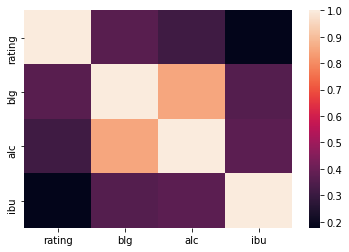

In [291]:
sns.heatmap(cor)

In [311]:
def wordcloud_on_df(df,column_name):
    comment_words = ''
    for text in tqdm(df[column_name].dropna()):
        words = text.split()
        words = [word.lower() for word in words]

        comment_words += " ".join(words)+" "
    stopwords = set(STOPWORDS)
    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(comment_words)
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)

    plt.show()

100%|██████████████████████████████████████████████████████████████████████████| 69927/69927 [00:28<00:00, 2445.75it/s]


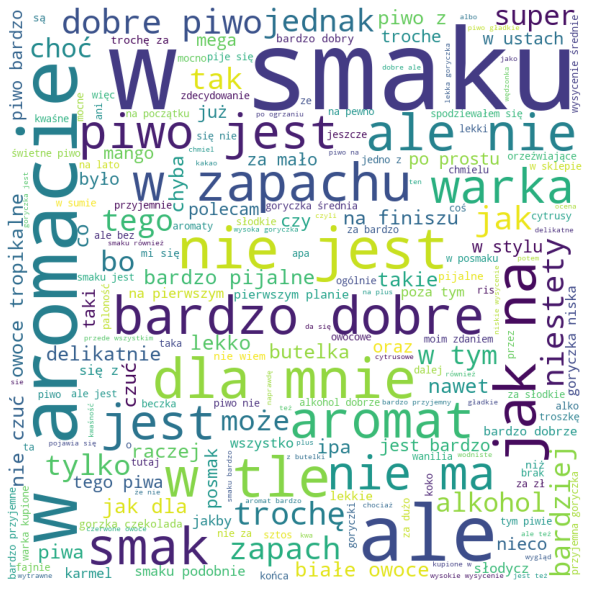

In [312]:
wordcloud_on_df(ratings,"comment")

100%|██████████████████████████████████████████████████████████████████████████| 9704/9704 [00:00<00:00, 607168.29it/s]


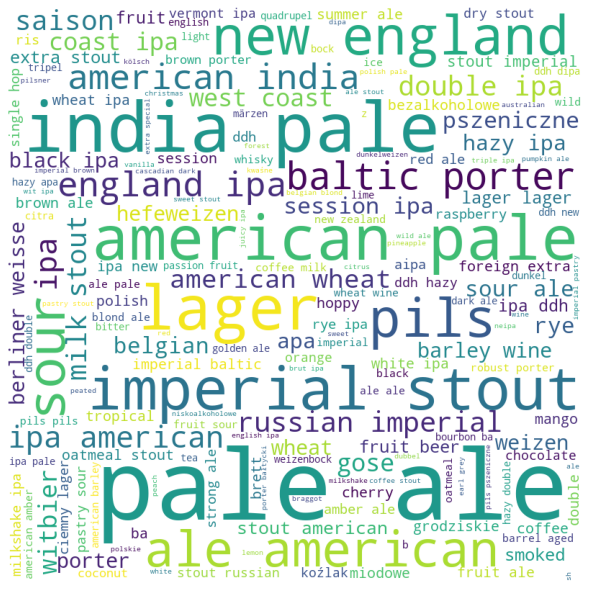

In [313]:
wordcloud_on_df(meta,"STYL")